In [1]:
import os
import re
import sys
import gzip
import json
import joblib
import hashlib
import numpy as np
import pandas as pd
from tqdm import tqdm

import scipy
import sklearn
from sklearn import metrics
import lightgbm as lgb

from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit import RDLogger
lg = RDLogger.logger()
lg.setLevel(RDLogger.CRITICAL)

from IPython.display import SVG
from rdkit.Chem.Draw import MolsToGridImage, MolToImage
from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.ipython_useSVG = True # Change output to SVG format
IPythonConsole.drawOptions.addAtomIndices = True
IPythonConsole.molSize = 500,500

In [2]:
import matplotlib.pyplot as plt

# config
plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams.update({'font.size': 16})

# Change Matplotlib font to Helvetica
import matplotlib as mpl
import matplotlib.font_manager as fm
mpl.rcParams['font.family'] = 'Helvetica'
fm.findfont("Helvetica", fontext="ttx", rebuild_if_missing=False)

'/System/Library/Fonts/Helvetica.ttc'

In [3]:
def remove_atom_mapping(smiles: str) -> str:
    """
    Remove the atom mapping of a reaction SMILES.
    The resulting SMILES strings will still contain brackets and it may be
    advisable to canonicalize them or clean them up as a postprocessing step.
    Args:
        smiles: SMILES string potentially containing mapping information.
    Returns:
        A SMILES string without atom mapping information.
    """

    # We look for ":" followed by digits before a "]" not coming after an "*"
    return re.sub(r"(?<=[^\*])(:\d+)]", "]", smiles)

In [4]:
base_dir = os.path.dirname(os.path.realpath('__file__')).replace('/scripts/MLtest', '')
base_dir

'/Users/nicolairee/KU_data/esnuelML/ESNUEL_ML'

# Load Models

In [5]:
sys.path.append(os.path.join(base_dir, 'src/esnuelML'))
from DescriptorCreator.GraphChargeShell import GraphChargeShell
from predictor import run_MAA_and_MCA_predictions, pred_MAA_and_MCA

SQM folder is: 
/Users/nicolairee/KU_data/esnuelML/ESNUEL_ML/desc_calcs


# Experimental data

In [6]:
df_mca = pd.read_csv(os.path.join(base_dir, 'data/benchmark/MCA_paper_fig5.csv'))
print(df_mca.shape[0])
# df_mca['canon_smiles'] = df_mca['smiles'].apply(lambda smi: Chem.MolToSmiles(Chem.MolFromSmiles(remove_atom_mapping(smi))))
df_mca.head(2)

90


,name,smiles,atomIdx,exp. SnN,MCA PBE0-D3(BJ)/DEF2-TZVP COSMO(inf),MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO),MCA lightGBM,MCA lightGBM estimated error
0,mca1,N#C[C-](C)C1=CC=CC=C1,2,16.7910,556.935102,586.122396,385.306413,28.719391
1,mca2,[O-]/C(OCC)=C\C1=CC=CC=C1,5,15.6978,565.514219,599.191014,419.873043,59.152074


In [7]:
df_mca['formalCharge'] = df_mca['smiles'].apply(lambda smi: Chem.GetFormalCharge(Chem.AddHs(Chem.MolFromSmiles(smi))))
df_mca.head(2)

,name,smiles,atomIdx,exp. SnN,MCA PBE0-D3(BJ)/DEF2-TZVP COSMO(inf),MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO),MCA lightGBM,MCA lightGBM estimated error,formalCharge
0,mca1,N#C[C-](C)C1=CC=CC=C1,2,16.7910,556.935102,586.122396,385.306413,28.719391,-1
1,mca2,[O-]/C(OCC)=C\C1=CC=CC=C1,5,15.6978,565.514219,599.191014,419.873043,59.152074,-1


In [8]:
# df_mca = df_mca[df_mca['formalCharge'] == 0]
# print(df_mca.shape[0])

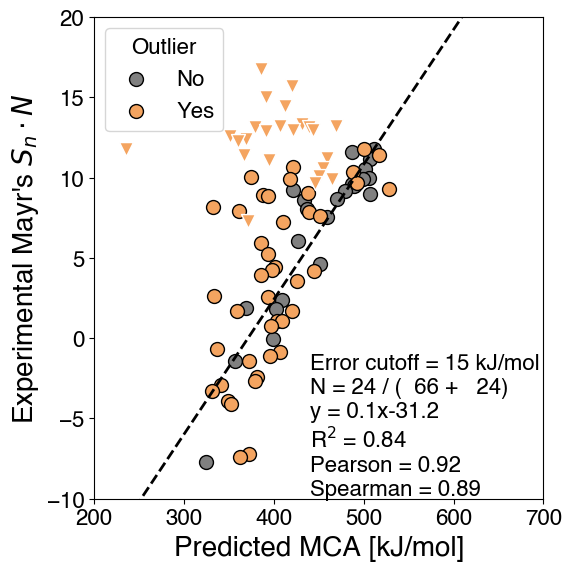

In [9]:
cutoff = 25
cutoff = 20
cutoff = 15

x = df_mca[(df_mca['formalCharge'] == 0) & (df_mca['MCA lightGBM estimated error'] <= cutoff)]['MCA lightGBM']
y = df_mca[(df_mca['formalCharge'] == 0) & (df_mca['MCA lightGBM estimated error'] <= cutoff)]['exp. SnN']

x2 = df_mca[(df_mca['formalCharge'] == 0) & (df_mca['MCA lightGBM estimated error'] > cutoff)]['MCA lightGBM']
y2 = df_mca[(df_mca['formalCharge'] == 0) & (df_mca['MCA lightGBM estimated error'] > cutoff)]['exp. SnN']

x3 = df_mca[(df_mca['formalCharge'] != 0) & (df_mca['MCA lightGBM estimated error'] <= cutoff)]['MCA lightGBM']
y3 = df_mca[(df_mca['formalCharge'] != 0) & (df_mca['MCA lightGBM estimated error'] <= cutoff)]['exp. SnN']

x4 = df_mca[(df_mca['formalCharge'] != 0) & (df_mca['MCA lightGBM estimated error'] > cutoff)]['MCA lightGBM']
y4 = df_mca[(df_mca['formalCharge'] != 0) & (df_mca['MCA lightGBM estimated error'] > cutoff)]['exp. SnN']

fig = plt.figure(figsize=(6, 6))
plt.scatter(x, y, marker='o', s=100, alpha=1, color='gray', edgecolors='k', label='No')
plt.scatter(x2, y2, marker='o', s=100, alpha=1, color='sandybrown', edgecolors='k', label='Yes')
plt.scatter(x3, y3, marker='v', s=100, alpha=1, color='gray', edgecolors='w')
plt.scatter(x4, y4, marker='v', s=100, alpha=1, color='sandybrown', edgecolors='w')
plt.xlabel('Predicted MCA [kJ/mol]', fontsize=20)
plt.ylabel(r"Experimental Mayr's $S_{n}\cdot N$", fontsize=20)


slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
plt.plot(np.arange(200,700,1), slope * np.arange(200,700,1) + intercept, 'k', linestyle='dashed', lw=2)
fit_eq = str(np.poly1d(np.polyfit(x, y, 1))).replace(' \n', '')

plt.text(0.48, 0.15, f"Error cutoff = {cutoff} kJ/mol \nN = {len(x)} / (  {df_mca[df_mca['formalCharge'] == 0].shape[0]} +   {df_mca[df_mca['formalCharge'] != 0].shape[0]})\ny = {slope:.1f}x{intercept:.1f} \nR$^2$ = {r_value**2:.2f} \nPearson = {scipy.stats.pearsonr(x, y).statistic:.2f} \nSpearman = {scipy.stats.spearmanr(x, y).correlation:.2f}", color='k', fontsize=16, horizontalalignment='left',
     verticalalignment='center', transform=plt.gca().transAxes)

plt.xticks(np.arange(200,701,100), fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(200,700)
plt.ylim(-10,20)

plt.legend(loc=2, title="Outlier")
plt.tight_layout()

plt.savefig(f'figures/MCAbenchmarkEXP_cufoff{cutoff}.pdf')
plt.show()

In [10]:
from bokeh.io import output_notebook
from bokeh.models import HoverTool
from bokeh.plotting import figure, show, ColumnDataSource

from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.ipython_useSVG = True # Change output to SVG format
IPythonConsole.drawOptions.addAtomIndices = True
IPythonConsole.molSize = 200,200

# Configure for output in the notebook
output_notebook()

# Create SVGs for each smiles
rdkit_mol_list = [Chem.MolFromSmiles(smi) for smi in df_mca[df_mca['MCA lightGBM estimated error'] <= cutoff].smiles.tolist()]
for mol, site in zip(rdkit_mol_list,df_mca[df_mca['MCA lightGBM estimated error'] <= cutoff].atomIdx.tolist()):
    mol.__sssAtoms = [int(site)]
imgs = [mol._repr_svg_() for mol in rdkit_mol_list]

# Load the data into a source and plot
source = ColumnDataSource(
    data={
        "x": x,
        "y": y,
        "imgs": imgs,
        "smiles": df_mca[df_mca['MCA lightGBM estimated error'] <= cutoff].smiles.tolist(),
        "error": df_mca[df_mca['MCA lightGBM estimated error'] <= cutoff]['MCA lightGBM estimated error'].tolist(),
    }
)

# Create SVGs for each smiles
df_mca2 = df_mca[df_mca['MCA lightGBM estimated error'] > cutoff]

rdkit_mol_list = [Chem.MolFromSmiles(smi) for smi in df_mca2.smiles.tolist()]
for mol, site in zip(rdkit_mol_list,df_mca2.atomIdx.tolist()):
    mol.__sssAtoms = [int(site)]
imgs = [mol._repr_svg_() for mol in rdkit_mol_list]

source2 = ColumnDataSource(
    data={
        "x": x2,
        "y": y2,
        "imgs": imgs,
        "smiles": df_mca2.smiles.tolist(),
        "error": df_mca2['MCA lightGBM estimated error'].tolist(),
    }
)

p = figure(max_width=700, height=400)
p.scatter("x", "y", source=source)
p.scatter("x", "y", source=source2, color='red')
p.sizing_mode = "scale_width"
p.xaxis.axis_label = 'Predicted MCA [kJ/mol]'
p.yaxis.axis_label = "Experimental Mayr's S_n N"

# Create tooltips referencing stored images
TOOLTIPS = """\
    <div>
        <div>
            @imgs{safe}
        </div>
        <div>
            <span>@smiles{safe}</span>
        </div>
        <div>
            <span>($x, $y)</span>
        </div>
        <div>
            Error: @error{safe}
        </div>
    </div>
"""

# Connect tooltips to plot
p.add_tools(HoverTool(tooltips=TOOLTIPS))

# Show figure
show(p)

Loading BokehJS ...

# QM data

In [11]:
df_nuc = pd.read_csv(os.path.join(base_dir, 'data/benchmark/nucleophilicity.csv'))
print(df_nuc.shape[0])
# df_nuc['canon_smiles'] = df_nuc['smiles'].apply(lambda smi: Chem.MolToSmiles(Chem.MolFromSmiles(remove_atom_mapping(smi))))
df_nuc.head(2)

1229


,name,smiles,atomIdx,MCA PBE0-D3(BJ)/DEF2-TZVP COSMO(inf),MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO),MCA lightGBM,MCA lightGBM estimated error
0,baldiNUC1,CC(C)(C)C[O:1]CC(C)(C)C,5,275.306076,324.454275,325.166019,19.664086
1,baldiNUC2,c1ccc(CC(c2ccccc2)=[O:1])cc1,12,296.181700,336.079165,336.753036,11.448423


In [12]:
df_nuc['formalCharge'] = df_nuc['smiles'].apply(lambda smi: Chem.GetFormalCharge(Chem.AddHs(Chem.MolFromSmiles(smi))))
df_nuc.head(2)

,name,smiles,atomIdx,MCA PBE0-D3(BJ)/DEF2-TZVP COSMO(inf),MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO),MCA lightGBM,MCA lightGBM estimated error,formalCharge
0,baldiNUC1,CC(C)(C)C[O:1]CC(C)(C)C,5,275.306076,324.454275,325.166019,19.664086,0
1,baldiNUC2,c1ccc(CC(c2ccccc2)=[O:1])cc1,12,296.181700,336.079165,336.753036,11.448423,0


In [13]:
# df_nuc = df_nuc[df_nuc['formalCharge'] == 0]
# print(df_nuc.shape[0])

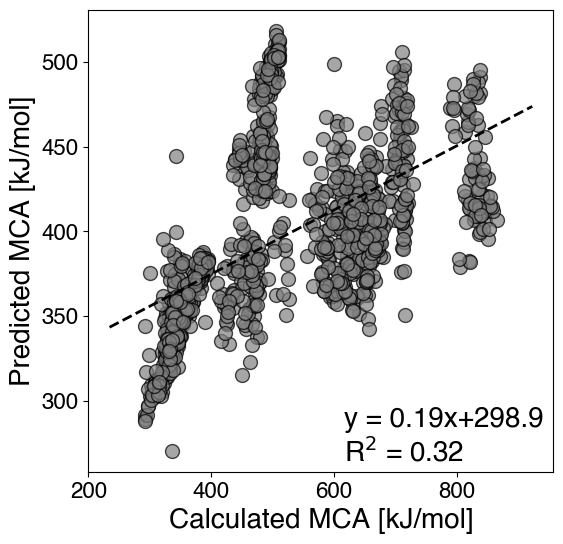

In [14]:
cutoff = np.inf
# x = df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff]['MCA PBE0-D3(BJ)/DEF2-TZVP COSMO(inf)']
x = df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff]['MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO)']
y = df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff]['MCA lightGBM']

# x2 = df_nuc[df_nuc['MCA lightGBM estimated error'] > cutoff]['MCA PBE0-D3(BJ)/DEF2-TZVP COSMO(inf)']
x2 = df_nuc[df_nuc['MCA lightGBM estimated error'] > cutoff]['MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO)']
y2 = df_nuc[df_nuc['MCA lightGBM estimated error'] > cutoff]['MCA lightGBM']

fig = plt.figure(figsize=(6, 6))
plt.scatter(x, y, marker='o', s=100, alpha=0.7, color='gray', edgecolors='k')
# plt.scatter(x2, y2, marker='o', s=100, alpha=0.7, color='sandybrown', edgecolors='k')
# plt.xlabel('PBE0(disp)/DEF2-TZVP MCA [kJ/mol]', fontsize=20)
# plt.xlabel('r$^2$SCAN-3c//GFN1-xTB MCA [kJ/mol]', fontsize=20)
plt.xlabel('Calculated MCA [kJ/mol]', fontsize=20)
plt.ylabel('Predicted MCA [kJ/mol]', fontsize=20)

xmin = min(np.concatenate([x,x2])) - (max(np.concatenate([x,x2])) - min(np.concatenate([x,x2]))) * 0.1
xmax = max(np.concatenate([x,x2])) + (max(np.concatenate([x,x2])) - min(np.concatenate([x,x2]))) * 0.1
ymin = min(np.concatenate([y,y2])) - (max(np.concatenate([y,y2])) - min(np.concatenate([y,y2]))) * 0.1
ymax = max(np.concatenate([y,y2])) + (max(np.concatenate([y,y2])) - min(np.concatenate([y,y2]))) * 0.1

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
plt.plot(np.arange(xmin,xmax,1), slope * np.arange(xmin,xmax,1) + intercept, 'k', linestyle='dashed', lw=2)

fit_eq = str(np.poly1d(np.polyfit(x, y, 1))).replace(' \n', '')
plt.text(0.55, 0.075, f"y = {slope:.2f}x+{intercept:.1f} \nR$^2$ = {r_value**2:.2f}", color='k', fontsize=20, horizontalalignment='left',
     verticalalignment='center', transform=plt.gca().transAxes)
plt.show()

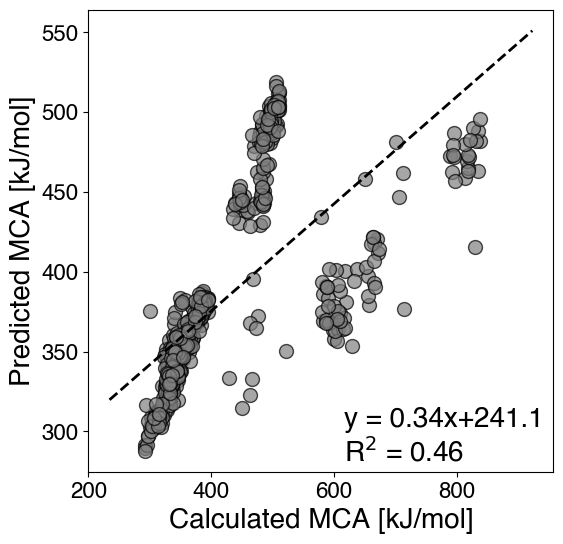

In [15]:
cutoff = 25
# x = df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff]['MCA PBE0-D3(BJ)/DEF2-TZVP COSMO(inf)']
x = df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff]['MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO)']
y = df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff]['MCA lightGBM']

# x2 = df_nuc[df_nuc['MCA lightGBM estimated error'] > cutoff]['MCA PBE0-D3(BJ)/DEF2-TZVP COSMO(inf)']
x2 = df_nuc[df_nuc['MCA lightGBM estimated error'] > cutoff]['MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO)']
y2 = df_nuc[df_nuc['MCA lightGBM estimated error'] > cutoff]['MCA lightGBM']

fig = plt.figure(figsize=(6, 6))
plt.scatter(x, y, marker='o', s=100, alpha=0.7, color='gray', edgecolors='k')
# plt.scatter(x2, y2, marker='o', s=100, alpha=0.7, color='sandybrown', edgecolors='k')
# plt.xlabel('PBE0(disp)/DEF2-TZVP MCA [kJ/mol]', fontsize=20)
# plt.xlabel('r$^2$SCAN-3c//GFN1-xTB MCA [kJ/mol]', fontsize=20)
plt.xlabel('Calculated MCA [kJ/mol]', fontsize=20)
plt.ylabel('Predicted MCA [kJ/mol]', fontsize=20)

xmin = min(np.concatenate([x,x2])) - (max(np.concatenate([x,x2])) - min(np.concatenate([x,x2]))) * 0.1
xmax = max(np.concatenate([x,x2])) + (max(np.concatenate([x,x2])) - min(np.concatenate([x,x2]))) * 0.1
ymin = min(np.concatenate([y,y2])) - (max(np.concatenate([y,y2])) - min(np.concatenate([y,y2]))) * 0.1
ymax = max(np.concatenate([y,y2])) + (max(np.concatenate([y,y2])) - min(np.concatenate([y,y2]))) * 0.1

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
plt.plot(np.arange(xmin,xmax,1), slope * np.arange(xmin,xmax,1) + intercept, 'k', linestyle='dashed', lw=2)

fit_eq = str(np.poly1d(np.polyfit(x, y, 1))).replace(' \n', '')
plt.text(0.55, 0.075, f"y = {slope:.2f}x+{intercept:.1f} \nR$^2$ = {r_value**2:.2f}", color='k', fontsize=20, horizontalalignment='left',
     verticalalignment='center', transform=plt.gca().transAxes)
plt.show()

In [16]:
from bokeh.io import output_notebook
from bokeh.models import HoverTool
from bokeh.plotting import figure, show, ColumnDataSource

from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.ipython_useSVG = True # Change output to SVG format
IPythonConsole.drawOptions.addAtomIndices = True
IPythonConsole.molSize = 200,200

# Configure for output in the notebook
output_notebook()

# Create SVGs for each smiles
rdkit_mol_list = [Chem.MolFromSmiles(smi) for smi in df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff].smiles.tolist()]
for mol, site in zip(rdkit_mol_list,df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff].atomIdx.tolist()):
    mol.__sssAtoms = [int(site)]
imgs = [mol._repr_svg_() for mol in rdkit_mol_list]

# Load the data into a source and plot
source = ColumnDataSource(
    data={
        "x": x,
        "y": y,
        "imgs": imgs,
        "smiles": df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff].smiles.tolist(),
        "error": df_nuc[df_nuc['MCA lightGBM estimated error'] <= cutoff]['MCA lightGBM estimated error'].tolist(),
    }
)

# Create SVGs for each smiles
df_nuc2 = df_nuc[df_nuc['MCA lightGBM estimated error'] > cutoff]

rdkit_mol_list = [Chem.MolFromSmiles(smi) for smi in df_nuc2.smiles.tolist()]
for mol, site in zip(rdkit_mol_list,df_nuc2.atomIdx.tolist()):
    mol.__sssAtoms = [int(site)]
imgs = [mol._repr_svg_() for mol in rdkit_mol_list]

source2 = ColumnDataSource(
    data={
        "x": x2,
        "y": y2,
        "imgs": imgs,
        "smiles": df_nuc2.smiles.tolist(),
        "error": df_nuc2['MCA lightGBM estimated error'].tolist(),
    }
)

p = figure(max_width=700, height=400)
p.scatter("x", "y", source=source)
p.scatter("x", "y", source=source2, color='red')
#p.line(np.arange(-10,11,1), slope * np.arange(-10,11,1) + intercept)
p.sizing_mode = "scale_width"
p.xaxis.axis_label = 'Calcuclated MCA [kJ/mol]'
p.yaxis.axis_label = 'Predicted MCA [kJ/mol]'

# Create tooltips referencing stored images
TOOLTIPS = """\
    <div>
        <div>
            @imgs{safe}
        </div>
        <div>
            <span>@smiles{safe}</span>
        </div>
        <div>
            <span>($x, $y)</span>
        </div>
        <div>
            Error: @error{safe}
        </div>
    </div>
"""

# Connect tooltips to plot
p.add_tools(HoverTool(tooltips=TOOLTIPS))

# Show figure
show(p)

Loading BokehJS ...

<Figure size 800x800 with 0 Axes>

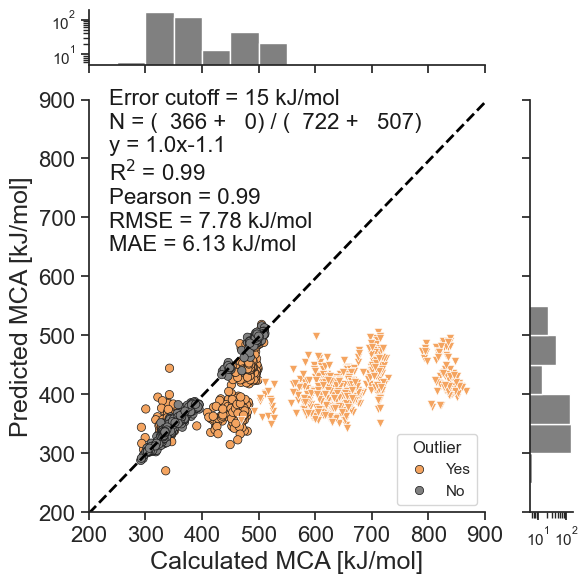

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from scipy import stats

fig = plt.figure(figsize=(8, 8))
sns.set_theme(style='ticks')

cutoff = 25
cutoff = 20
cutoff = 15

x = df_nuc['MCA r2SCAN-3c SMD(DMSO)//GFN1-xTB ALPB(DMSO)']
y = df_nuc['MCA lightGBM']
e = df_nuc['MCA lightGBM estimated error']
formalcharge = df_nuc['formalCharge']
df_plot = pd.DataFrame(np.column_stack((x,y,e,formalcharge)), columns=["x", "y", "e", "formalCharge"])
df_plot['Outliers'] = df_plot['e'].apply(lambda e: 'Yes' if e > cutoff else 'No')
df_plot = df_plot.sort_values(by='e', ascending=False)

x = df_plot[df_plot['Outliers'] == 'No']['x']
y = df_plot[df_plot['Outliers'] == 'No']['y']

g = sns.JointGrid(x="x", y="y", data=df_plot[df_plot['formalCharge'] == 0], marginal_ticks=True, hue='Outliers')
g.ax_marg_x.hist(x, bins=np.arange(200, 901, 50), log=True, color="Grey")
g.ax_marg_y.hist(y, bins=np.arange(200, 901, 50), orientation="horizontal", log=True, color="Grey")
b = g.plot_joint(sns.scatterplot, alpha=1, palette=["sandybrown", "Grey"], linewidth=.5, edgecolors='k', rasterized=True)
# b = g.plot_joint(sns.kdeplot, levels=4, fill=True, alpha=0.6, cut=1)
# g.ax_joint.scatter(df_plot[df_plot['formalCharge'] != 0]['x'].tolist(), df_plot[df_plot['formalCharge'] != 0]['y'].tolist(), marker='o', alpha=1, color='None', edgecolors='Tomato', linewidth=1, rasterized=True)
g.ax_joint.scatter(df_plot[(df_plot['formalCharge'] != 0) & (df_plot['Outliers'] == 'Yes')]['x'].tolist(), df_plot[(df_plot['formalCharge'] != 0) & (df_plot['Outliers'] == 'Yes')]['y'].tolist(), marker='v', alpha=1, color='sandybrown', edgecolors='w', linewidth=.5, rasterized=True)
g.ax_joint.scatter(df_plot[(df_plot['formalCharge'] != 0) & (df_plot['Outliers'] == 'No')]['x'].tolist(), df_plot[(df_plot['formalCharge'] != 0) & (df_plot['Outliers'] == 'No')]['y'].tolist(), marker='v', alpha=1, color='Grey', edgecolors='w', linewidth=.5, rasterized=True)

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(list(x), list(y))
g.ax_joint.plot(np.arange(200,901,50), slope * np.arange(200,901,50) + intercept, 'Black', linestyle='dashed', lw=2)
if intercept > 0:
    # g.ax_joint.text(0.05, 0.825, f"Error cutoff = {cutoff} kJ/mol \nN = {len(x)} / {df_nuc.shape[0]} ({df_nuc[df_nuc['formalCharge'] == 0].shape[0]}) \ny = {slope:.1f}x+{intercept:.1f} \nR$^2$ = {r_value**2:.2f} \nPearson = {stats.pearsonr(x, y).statistic:.2f} \nSpearman = {stats.spearmanr(x, y).correlation:.2f}", color='k', fontsize=16, horizontalalignment='left',
    #  verticalalignment='center', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.05, 0.825, f"Error cutoff = {cutoff} kJ/mol \nN = (  {df_plot[(df_plot['Outliers'] == 'No') & (df_plot['formalCharge'] == 0)].shape[0]} +   {df_plot[(df_plot['Outliers'] == 'No') & (df_plot['formalCharge'] != 0)].shape[0]}) / (  {df_plot[df_plot['formalCharge'] == 0].shape[0]} +   {df_plot[df_plot['formalCharge'] != 0].shape[0]}) \ny = {slope:.1f}x+{intercept:.1f} \nR$^2$ = {r_value**2:.2f} \nPearson = {stats.pearsonr(x, y).statistic:.2f} \nRMSE = {metrics.mean_squared_error(x, y, squared=False):.2f} kJ/mol \nMAE = {metrics.mean_absolute_error(x, y):.2f} kJ/mol", color='k', fontsize=16, horizontalalignment='left',
     verticalalignment='center', transform=g.ax_joint.transAxes)
else:
    # g.ax_joint.text(0.05, 0.825, f"Error cutoff = {cutoff} kJ/mol \nN = {len(x)} / {df_nuc.shape[0]} ({df_nuc[df_nuc['formalCharge'] == 0].shape[0]}) \ny = {slope:.1f}x{intercept:.1f} \nR$^2$ = {r_value**2:.2f} \nPearson = {stats.pearsonr(x, y).statistic:.2f} \nSpearman = {stats.spearmanr(x, y).correlation:.2f}", color='k', fontsize=16, horizontalalignment='left',
    #  verticalalignment='center', transform=g.ax_joint.transAxes)
    g.ax_joint.text(0.05, 0.825, f"Error cutoff = {cutoff} kJ/mol \nN = (  {df_plot[(df_plot['Outliers'] == 'No') & (df_plot['formalCharge'] == 0)].shape[0]} +   {df_plot[(df_plot['Outliers'] == 'No') & (df_plot['formalCharge'] != 0)].shape[0]}) / (  {df_plot[df_plot['formalCharge'] == 0].shape[0]} +   {df_plot[df_plot['formalCharge'] != 0].shape[0]}) \ny = {slope:.1f}x{intercept:.1f} \nR$^2$ = {r_value**2:.2f} \nPearson = {stats.pearsonr(x, y).statistic:.2f} \nRMSE = {metrics.mean_squared_error(x, y, squared=False):.2f} kJ/mol \nMAE = {metrics.mean_absolute_error(x, y):.2f} kJ/mol", color='k', fontsize=16, horizontalalignment='left',
     verticalalignment='center', transform=g.ax_joint.transAxes)

# g.ax_joint.set_xlabel('r$^2$SCAN-3c//GFN1-xTB MCA [kJ/mol]', fontsize=18)
g.ax_joint.set_xlabel('Calculated MCA [kJ/mol]', fontsize=18)
g.ax_joint.set_ylabel('Predicted MCA [kJ/mol]', fontsize=18)
g.ax_joint.tick_params(axis='both', which='major', labelsize=16)
g.ax_joint.set_xticks(np.arange(200,901,100))
g.ax_joint.set_yticks(np.arange(200,901,100))
g.ax_joint.set_xlim(200,900)
g.ax_joint.set_ylim(200,900)
g.ax_joint.legend(loc=4, title="Outlier")

plt.tight_layout()
plt.savefig(f'figures/MCAbenchmark_cufoff{cutoff}.pdf')
plt.show()